In [1]:
# import all the necessary modeules
import dask.dataframe as dd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.offline as py
import plotly.graph_objs as go
import plotly.tools as tls
import warnings

# apply notebook settings
%matplotlib inline
py.init_notebook_mode(connected=True)
warnings.filterwarnings('ignore')
pd.options.display.max_rows = None
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', -1)

In [2]:
# import data using dask and then convert it to pandas dataframe
df = dd.read_csv('FEATURES-2014-2015/part-067.csv')
df = df.compute()

In [3]:
df.head()

,host,process,timestamp,isAnomaly,"Prepared statement cache hit rate : ((MXBean(com.bea:Name=source06,Type=JDBCDataSourceRuntime).PrepStmtCacheHitCount / MXBean(com.bea:Name=source06,Type=JDBCDataSourceRuntime).PrepStmtCacheMissCount))","Memory space usage : ((MXBean(java.lang:name=Code Cache,type=MemoryPool).Usage.committed / MXBean(java.lang:name=Code Cache,type=MemoryPool).Usage.max))","Active connections : (MXBean(com.bea:Name=source04,Type=JDBCConnectionPoolRuntime).ActiveConnectionsCurrentCount)","Available db connection activity : (d/dx (MXBean(com.bea:Name=source02,Type=JDBCDataSourceRuntime).NumAvailable))","Active connections : (MXBean(com.bea:Name=source03,Type=JDBCConnectionPoolRuntime).ActiveConnectionsCurrentCount)","DB connection started : (incld/dx (MXBean(com.bea:Name=source02,Type=JDBCDataSourceRuntime).ConnectionsTotalCount))",Heap usage activity : (d/dx (MXBean(java.lang:type=Memory).HeapMemoryUsage.used)),"Connection delay : (MXBean(com.bea:Name=source10,Type=JDBCDataSourceRuntime).ConnectionDelayTime)","Stuck threads : (MXBean(com.bea:Name=ThreadPoolRuntime,Type=ThreadPoolRuntime).StuckThreadCount)","Reserve request activity : (incld/dx (MXBean(com.bea:Name=source02,Type=JDBCDataSourceRuntime).ReserveRequestCount))","Stuck threads : (MXBean(com.bea:Name=DataRetirementWorkManager,Type=WorkManagerRuntime).StuckThreadCount)","DB connection started : (incld/dx (MXBean(com.bea:Name=source09,Type=JDBCConnectionPoolRuntime).ConnectionsTotalCount))","Connection delay : (MXBean(com.bea:Name=source06,Type=JDBCDataSourceRuntime).ConnectionDelayTime)","Active connections : (MXBean(com.bea:Name=source01,Type=JDBCDataSourceRuntime).ActiveConnectionsCurrentCount)","Memory space activity : (d/dx ((MXBean(java.lang:name=PS Old Gen,type=MemoryPool).Usage.committed / MXBean(java.lang:name=PS Old Gen,type=MemoryPool).Usage.max)))","Active connections : (MXBean(com.bea:Name=source08,Type=JDBCConnectionPoolRuntime).ActiveConnectionsCurrentCount)",Rel. heap committed : ((MXBean(java.lang:type=Memory).HeapMemoryUsage.committed / MXBean(java.lang:type=Memory).HeapMemoryUsage.max)),"Active connections : (MXBean(com.bea:Name=source05,Type=JDBCConnectionPoolRuntime).ActiveConnectionsCurrentCount)","DB connection started : (incld/dx (MXBean(com.bea:Name=source01,Type=JDBCConnectionPoolRuntime).ConnectionsTotalCount))",Rel. nonHeap usage : ((MXBean(java.lang:type=Memory).NonHeapMemoryUsage.used / MXBean(java.lang:type=Memory).NonHeapMemoryUsage.max)),"DB connection started : (incld/dx (MXBean(com.bea:Name=source03,Type=JDBCConnectionPoolRuntime).ConnectionsTotalCount))","Prepared statement cache hit rate : ((MXBean(com.bea:Name=source01,Type=JDBCDataSourceRuntime).PrepStmtCacheHitCount / MXBean(com.bea:Name=source01,Type=JDBCDataSourceRuntime).PrepStmtCacheMissCount))","Connection delay : (MXBean(com.bea:Name=source03,Type=JDBCDataSourceRuntime).ConnectionDelayTime)","Reserve request activity : (incld/dx (MXBean(com.bea:Name=source08,Type=JDBCDataSourceRuntime).ReserveRequestCount))",Rel. Swap Usage : ((\Swap\used / \Swap\total)),"Stuck threads : (MXBean(com.bea:Name=ClusterMessaging,Type=WorkManagerRuntime).StuckThreadCount)","Failing reserve requests : (incld/dx (MXBean(com.bea:Name=source04,Type=JDBCDataSourceRuntime).FailedReserveRequestCount))","Failing reserve requests : (incld/dx (MXBean(com.bea:Name=source06,Type=JDBCDataSourceRuntime).FailedReserveRequestCount))","Failing reserve requests : (incld/dx (MXBean(com.bea:Name=source08,Type=JDBCDataSourceRuntime).FailedReserveRequestCount))","Stuck threads : (MXBean(com.bea:ApplicationRuntime=batchModules2,Name=default,Type=WorkManagerRuntime).StuckThreadCount)","Active connections : (MXBean(com.bea:Name=source05,Type=JDBCDataSourceRuntime).ActiveConnectionsCurrentCount)","Reserve request activity : (incld/dx (MXBean(com.bea:Name=source10,Type=JDBCDataSourceRuntime).ReserveRequestCount))","Memory space usage : ((MXBean(java.lang:name=PS Perm Gen,type=MemoryPool).Usage.committed / M

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40252 entries, 0 to 40251
Columns: 235 entries, host to Connection delay : (MXBean(com.bea:Name=source02,Type=JDBCDataSourceRuntime).ConnectionDelayTime)
dtypes: bool(1), float64(231), object(3)
memory usage: 71.9+ MB


In [5]:
df.describe().T.sort_index()

,count,mean,std,min,25%,50%,75%,max
"Active connections : (MXBean(com.bea:Name=source01,Type=JDBCConnectionPoolRuntime).ActiveConnectionsCurrentCount)",40252.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
"Active connections : (MXBean(com.bea:Name=source01,Type=JDBCDataSourceRuntime).ActiveConnectionsCurrentCount)",40252.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
"Active connections : (MXBean(com.bea:Name=source02,Type=JDBCConnectionPoolRuntime).ActiveConnectionsCurrentCount)",40252.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
"Active connections : (MXBean(com.bea:Name=source02,Type=JDBCDataSourceRuntime).ActiveConnectionsCurrentCount)",40252.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
"Active connections : (MXBean(com.bea:Name=source03,Type=JDBCConnectionPoolRuntime).ActiveConnectionsCurrentCount)",40252.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
"Active connections : (MXBean(com.bea:Name=source03,Type=JDBCDataSourceRuntime).ActiveConnectionsCurrentCount)",40252.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
"Active connections : (MXBean(com.bea:Name=source04,Type=JDBCConnectionPoolRuntime).ActiveConnectionsCurrentCount)",40252.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
"Active connections : (MXBean(com.bea:Name=source04,Type=JDBCDataSourceRuntime).ActiveConnectionsCurrentCount)",40252.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
"Active connections : (MXBean(com.bea:Name=source05,Type=JDBCConnectionPoolRuntime).ActiveConnectionsCurrentCount)",40252.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
"Active connections : (MXBean(com.bea:Name=source05,Type=JDBCDataSourceRuntime).ActiveConnectionsCurrentCount)",40252.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00


In [6]:
df.shape

(40252, 235)

In [7]:
df['isAnomaly'].nunique()

2

### Columns with no information
From summary statistics, it is clear that a number of columns contain only one value in all rows. In other words, they do not contain any useful information. Below, we proceed to drop them from our dataframe.

In [8]:
#drop columns that contain only 1 unique value
for col in df.columns:
    if df[col].nunique() == 1:
        df = df.drop(col, 1)
df.shape

(40252, 101)

In [9]:
sorted(list(df.columns))

['Active connections : (MXBean(com.bea:Name=source08,Type=JDBCConnectionPoolRuntime).ActiveConnectionsCurrentCount)',
 'Active connections : (MXBean(com.bea:Name=source08,Type=JDBCDataSourceRuntime).ActiveConnectionsCurrentCount)',
 'Active connections : (MXBean(com.bea:Name=source09,Type=JDBCConnectionPoolRuntime).ActiveConnectionsCurrentCount)',
 'Active connections : (MXBean(com.bea:Name=source09,Type=JDBCDataSourceRuntime).ActiveConnectionsCurrentCount)',
 'Active connections : (MXBean(com.bea:Name=source10,Type=JDBCConnectionPoolRuntime).ActiveConnectionsCurrentCount)',
 'Active connections : (MXBean(com.bea:Name=source10,Type=JDBCDataSourceRuntime).ActiveConnectionsCurrentCount)',
 'Available db connection activity : (d/dx (MXBean(com.bea:Name=source01,Type=JDBCConnectionPoolRuntime).NumAvailable))',
 'Available db connection activity : (d/dx (MXBean(com.bea:Name=source04,Type=JDBCConnectionPoolRuntime).NumAvailable))',
 'Available db connection activity : (d/dx (MXBean(com.bea:N

### Feature names
We see that most column names are long and complicated, so we rename these columns into a more readable format.

In [10]:
# rename columns to a more readable format

df = df.rename(columns={'Active connections : (MXBean(com.bea:Name=source08,Type=JDBCConnectionPoolRuntime).ActiveConnectionsCurrentCount)':
                        'Active connections: source08 CPR',
                        'Active connections : (MXBean(com.bea:Name=source08,Type=JDBCDataSourceRuntime).ActiveConnectionsCurrentCount)':
                        'Active connections: source08 DSR',
                        'Active connections : (MXBean(com.bea:Name=source09,Type=JDBCConnectionPoolRuntime).ActiveConnectionsCurrentCount)':
                        'Active connections: source09 CPR',
                        'Active connections : (MXBean(com.bea:Name=source09,Type=JDBCDataSourceRuntime).ActiveConnectionsCurrentCount)':
                        'Active connections: source09 DSR',
                        'Active connections : (MXBean(com.bea:Name=source10,Type=JDBCConnectionPoolRuntime).ActiveConnectionsCurrentCount)':
                        'Active connections: source10 CPR',
                        'Active connections : (MXBean(com.bea:Name=source10,Type=JDBCDataSourceRuntime).ActiveConnectionsCurrentCount)':
                        'Active connections: source10 DSR',
                        'Available db connection activity : (d/dx (MXBean(com.bea:Name=source01,Type=JDBCConnectionPoolRuntime).NumAvailable))':
                        'Available db connection activity: source01 CPR',
                        'Available db connection activity : (d/dx (MXBean(com.bea:Name=source02,Type=JDBCConnectionPoolRuntime).NumAvailable))': 
                        'Available db connection activity: source02 CPR', 
                        'Available db connection activity : (d/dx (MXBean(com.bea:Name=source02,Type=JDBCDataSourceRuntime).NumAvailable))': 
                        'Available db connection activity: source02 DSR', 
                        'Available db connection activity : (d/dx (MXBean(com.bea:Name=source04,Type=JDBCConnectionPoolRuntime).NumAvailable))': 
                        'Available db connection activity: source04 CPR', 
                        'Available db connection activity : (d/dx (MXBean(com.bea:Name=source04,Type=JDBCDataSourceRuntime).NumAvailable))': 
                        'Available db connection activity: source04 DSR',
                        'Available db connection activity : (d/dx (MXBean(com.bea:Name=source08,Type=JDBCConnectionPoolRuntime).NumAvailable))': 
                        'Available db connection activity: source08 CPR', 
                        'Available db connection activity : (d/dx (MXBean(com.bea:Name=source08,Type=JDBCDataSourceRuntime).NumAvailable))': 
                        'Available db connection activity: source08 DSR',
                        'Available db connection activity : (d/dx (MXBean(com.bea:Name=source09,Type=JDBCConnectionPoolRuntime).NumAvailable))': 
                        'Available db connection activity: source09 CPR', 
                        'Available db connection activity : (d/dx (MXBean(com.bea:Name=source09,Type=JDBCDataSourceRuntime).NumAvailable))': 
                        'Available db connection activity: source09 DSR', 
                        
               'Class loading activity : (d/dx (MXBean(java.lang:type=ClassLoading).LoadedClassCount))': 
               'Class loading activity', 
               'Class unloading activity : (d/dx (MXBean(java.lang:type=ClassLoading).UnloadedClassCount))': 
               'Class unloading activity', 
               'DB connection started : (incld/dx (MXBean(com.bea:Name=source08,Type=JDBCConnectionPoolRuntime).ConnectionsTotalCount))': 
               'DB connection started: source08 CPR', 
               'DB connection started : (incld/dx (MXBean(com.bea:Name=source08,Type=JDBCDataSourceRuntime).ConnectionsTotalCount))': 
               'DB connection started: source08 DSR',
               'DB connection started : (incld/dx (MXBean(com.bea:Name=source09,Type=JDBCConnectionPoolRuntime).ConnectionsTotalCount))': 
               'DB connection started: source09 CPR', 
               'DB connection started : (incld/dx (MXBean(com.bea:Name=source09,Type=JDBCDataSourceRuntime).ConnectionsTotalCount))': 
               'DB connection started: source09 DSR',
               'DB connection started : (incld/dx (MXBean(com.bea:Name=source10,Type=JDBCConnectionPoolRuntime).ConnectionsTotalCount))': 
               'DB connection started: source10 CPR', 
               'DB connection started : (incld/dx (MXBean(com.bea:Name=source10,Type=JDBCDataSourceRuntime).ConnectionsTotalCount))': 
               'DB connection started: source10 DSR',
               'Daemon thread count : (MXBean(java.lang:type=Threading).DaemonThreadCount)': 
               'Daemon thread count', 
               'GC activity : (incld/dx (MXBean(java.lang:name=PS MarkSweep,type=GarbageCollector).CollectionCount))': 
               'GC activity: Marksweep', 
               'GC activity : (incld/dx (MXBean(java.lang:name=PS Scavenge,type=GarbageCollector).CollectionCount))': 
               'GC activity: Scavenge', 
               'GC time : (incld/dx (MXBean(java.lang:name=PS MarkSweep,type=GarbageCollector).CollectionTime))': 
               'GC time: Marksweep', 
               'GC time : (incld/dx (MXBean(java.lang:name=PS Scavenge,type=GarbageCollector).CollectionTime))': 
               'GC time: Scavenge', 
               'Heap committed activity : (d/dx (MXBean(java.lang:type=Memory).HeapMemoryUsage.committed))': 
               'Heap committed activity', 
               'Heap usage activity : (d/dx (MXBean(java.lang:type=Memory).HeapMemoryUsage.used))': 
               'Heap usage activity', 
               'Last GC duration : (MXBean(java.lang:name=PS MarkSweep,type=GarbageCollector).LastGcInfo.duration)': 
               'Last GC duration: Marksweep', 
               'Last GC duration : (MXBean(java.lang:name=PS Scavenge,type=GarbageCollector).LastGcInfo.duration)': 
               'Last GC duration: Scavenge'
                       }
            )

In [11]:
# rename columns to a more readable format (contd.)

df = df.rename(columns={'Connection delay : (MXBean(com.bea:Name=source01,Type=JDBCConnectionPoolRuntime).ConnectionDelayTime)': 
                       'Connection delay: source01 CPR', 
                        'Connection delay : (MXBean(com.bea:Name=source01,Type=JDBCDataSourceRuntime).ConnectionDelayTime)': 
                       'Connection delay: source01 DSR',
                        'Connection delay : (MXBean(com.bea:Name=source02,Type=JDBCConnectionPoolRuntime).ConnectionDelayTime)': 
                       'Connection delay: source02 CPR', 
                        'Connection delay : (MXBean(com.bea:Name=source02,Type=JDBCDataSourceRuntime).ConnectionDelayTime)': 
                       'Connection delay: source02 DSR',
                        'Connection delay : (MXBean(com.bea:Name=source03,Type=JDBCConnectionPoolRuntime).ConnectionDelayTime)': 
                       'Connection delay: source03 CPR', 
                        'Connection delay : (MXBean(com.bea:Name=source03,Type=JDBCDataSourceRuntime).ConnectionDelayTime)': 
                       'Connection delay: source03 DSR',
                        'Connection delay : (MXBean(com.bea:Name=source04,Type=JDBCConnectionPoolRuntime).ConnectionDelayTime)': 
                       'Connection delay: source04 CPR', 
                        'Connection delay : (MXBean(com.bea:Name=source04,Type=JDBCDataSourceRuntime).ConnectionDelayTime)': 
                       'Connection delay: source04 DSR',
                        'Connection delay : (MXBean(com.bea:Name=source05,Type=JDBCConnectionPoolRuntime).ConnectionDelayTime)': 
                       'Connection delay: source05 CPR', 
                        'Connection delay : (MXBean(com.bea:Name=source05,Type=JDBCDataSourceRuntime).ConnectionDelayTime)': 
                       'Connection delay: source05 DSR',
                        'Connection delay : (MXBean(com.bea:Name=source06,Type=JDBCConnectionPoolRuntime).ConnectionDelayTime)': 
                       'Connection delay: source06 CPR', 
                        'Connection delay : (MXBean(com.bea:Name=source06,Type=JDBCDataSourceRuntime).ConnectionDelayTime)': 
                       'Connection delay: source06 DSR',
                        'Connection delay : (MXBean(com.bea:Name=source08,Type=JDBCConnectionPoolRuntime).ConnectionDelayTime)': 
                       'Connection delay: source08 CPR', 
                        'Connection delay : (MXBean(com.bea:Name=source08,Type=JDBCDataSourceRuntime).ConnectionDelayTime)': 
                       'Connection delay: source08 DSR',
                        'Connection delay : (MXBean(com.bea:Name=source09,Type=JDBCConnectionPoolRuntime).ConnectionDelayTime)': 
                       'Connection delay: source09 CPR', 
                        'Connection delay : (MXBean(com.bea:Name=source09,Type=JDBCDataSourceRuntime).ConnectionDelayTime)': 
                       'Connection delay: source09 DSR',
                        'Connection delay : (MXBean(com.bea:Name=source10,Type=JDBCConnectionPoolRuntime).ConnectionDelayTime)': 
                       'Connection delay: source10 CPR', 
                        'Connection delay : (MXBean(com.bea:Name=source10,Type=JDBCDataSourceRuntime).ConnectionDelayTime)': 
                       'Connection delay: source10 DSR'
                       }
            )

In [12]:
# rename columns to a more readable format (contd.)

df = df.rename(columns={'Memory space activity : (d/dx ((MXBean(java.lang:name=Code Cache,type=MemoryPool).Usage.committed / MXBean(java.lang:name=Code Cache,type=MemoryPool).Usage.max)))': 
                       'Memory space activity: Code Cache committed', 
                        'Memory space activity : (d/dx ((MXBean(java.lang:name=Code Cache,type=MemoryPool).Usage.used / MXBean(java.lang:name=Code Cache,type=MemoryPool).Usage.max)))': 
                       'Memory space activity: Code Cache used',
                        'Memory space activity : (d/dx ((MXBean(java.lang:name=PS Eden Space,type=MemoryPool).Usage.committed / MXBean(java.lang:name=PS Eden Space,type=MemoryPool).Usage.max)))': 
                       'Memory space activity: PS Eden Space committed', 
                        'Memory space activity : (d/dx ((MXBean(java.lang:name=PS Eden Space,type=MemoryPool).Usage.used / MXBean(java.lang:name=PS Eden Space,type=MemoryPool).Usage.max)))': 
                       'Memory space activity: PS Eden Space used',
                        'Memory space activity : (d/dx ((MXBean(java.lang:name=PS Old Gen,type=MemoryPool).Usage.committed / MXBean(java.lang:name=PS Old Gen,type=MemoryPool).Usage.max)))': 
                       'Memory space activity: PS Old Gen committed', 
                        'Memory space activity : (d/dx ((MXBean(java.lang:name=PS Old Gen,type=MemoryPool).Usage.used / MXBean(java.lang:name=PS Old Gen,type=MemoryPool).Usage.max)))': 
                       'Memory space activity: PS Old Gen used',
                        'Memory space activity : (d/dx ((MXBean(java.lang:name=PS Perm Gen,type=MemoryPool).Usage.committed / MXBean(java.lang:name=PS Perm Gen,type=MemoryPool).Usage.max)))': 
                       'Memory space activity: PS Perm Gen committed', 
                        'Memory space activity : (d/dx ((MXBean(java.lang:name=PS Perm Gen,type=MemoryPool).Usage.used / MXBean(java.lang:name=PS Perm Gen,type=MemoryPool).Usage.max)))': 
                       'Memory space activity: PS Perm Gen used',
                        'Memory space activity : (d/dx ((MXBean(java.lang:name=PS Survivor Space,type=MemoryPool).Usage.committed / MXBean(java.lang:name=PS Survivor Space,type=MemoryPool).Usage.max)))': 
                       'Memory space activity: PS Survivor Space committed', 
                        'Memory space activity : (d/dx ((MXBean(java.lang:name=PS Survivor Space,type=MemoryPool).Usage.used / MXBean(java.lang:name=PS Survivor Space,type=MemoryPool).Usage.max)))': 
                       'Memory space activity: PS Survivor Space used',
                        'Memory space usage : ((MXBean(java.lang:name=Code Cache,type=MemoryPool).Usage.committed / MXBean(java.lang:name=Code Cache,type=MemoryPool).Usage.max))':
                       'Memory space usage: Code Cache committed',
                        'Memory space usage : ((MXBean(java.lang:name=Code Cache,type=MemoryPool).Usage.used / MXBean(java.lang:name=Code Cache,type=MemoryPool).Usage.max))':
                       'Memory space usage: Code Cache used',
                        'Memory space usage : ((MXBean(java.lang:name=PS Eden Space,type=MemoryPool).Usage.committed / MXBean(java.lang:name=PS Eden Space,type=MemoryPool).Usage.max))':
                       'Memory space usage: PS Eden Space committed',
                        'Memory space usage : ((MXBean(java.lang:name=PS Eden Space,type=MemoryPool).Usage.used / MXBean(java.lang:name=PS Eden Space,type=MemoryPool).Usage.max))':
                       'Memory space usage: PS Eden Space used',
                        'Memory space usage : ((MXBean(java.lang:name=PS Old Gen,type=MemoryPool).Usage.committed / MXBean(java.lang:name=PS Old Gen,type=MemoryPool).Usage.max))':
                       'Memory space usage: PS Old Gen committed',
                        'Memory space usage : ((MXBean(java.lang:name=PS Old Gen,type=MemoryPool).Usage.used / MXBean(java.lang:name=PS Old Gen,type=MemoryPool).Usage.max))':
                       'Memory space usage: PS Old Gen used',
                        'Memory space usage : ((MXBean(java.lang:name=PS Perm Gen,type=MemoryPool).Usage.committed / MXBean(java.lang:name=PS Perm Gen,type=MemoryPool).Usage.max))':
                       'Memory space usage: PS Perm Gen committed',
                        'Memory space usage : ((MXBean(java.lang:name=PS Perm Gen,type=MemoryPool).Usage.used / MXBean(java.lang:name=PS Perm Gen,type=MemoryPool).Usage.max))':
                       'Memory space usage: PS Perm Gen used',
                        'Memory space usage : ((MXBean(java.lang:name=PS Survivor Space,type=MemoryPool).Usage.committed / MXBean(java.lang:name=PS Survivor Space,type=MemoryPool).Usage.max))':
                       'Memory space usage: PS Survivor Space committed',
                        'Memory space usage : ((MXBean(java.lang:name=PS Survivor Space,type=MemoryPool).Usage.used / MXBean(java.lang:name=PS Survivor Space,type=MemoryPool).Usage.max))':
                       'Memory space usage: PS Survivor Space used'
                       }
            )

In [13]:
# rename columns to a more readable format (contd.)

df = df.rename(columns={'NonHeap committed activity : (d/dx (MXBean(java.lang:type=Memory).NonHeapMemoryUsage.committed))':
                        'NonHeap committed activity',
                        'NonHeap usage activity : (d/dx (MXBean(java.lang:type=Memory).NonHeapMemoryUsage.used))':
                        'NonHeap usage activity',
                        'Objects to be finalized : (MXBean(java.lang:type=Memory).ObjectPendingFinalizationCount)':
                        'Objects to be finalized',
                        'Physical mem activity : (d/dx (MXBean(java.lang:type=OperatingSystem).FreePhysicalMemorySize))':
                        'Physical mem activity',
                        'Prepared statement cache hit rate : ((MXBean(com.bea:Name=source09,Type=JDBCDataSourceRuntime).PrepStmtCacheHitCount / MXBean(com.bea:Name=source09,Type=JDBCDataSourceRuntime).PrepStmtCacheMissCount))':
                        'Prepared statement cache hit rate',
                        'Process CPU : (MXBean(java.lang:type=OperatingSystem).ProcessCpuLoad)':
                        'Process CPU: OS',
                        'Process CPU : (\\Process(java)\\CPU)':
                        'Process CPU: java',
                        'Rel. Swap Usage : ((\\Swap\\used / \\Swap\\total))':
                        'Rel. Swap Usage',
                        'Rel. heap committed : ((MXBean(java.lang:type=Memory).HeapMemoryUsage.committed / MXBean(java.lang:type=Memory).HeapMemoryUsage.max))':
                        'Rel. heap committed',
                        'Rel. heap usage : ((MXBean(java.lang:type=Memory).HeapMemoryUsage.used / MXBean(java.lang:type=Memory).HeapMemoryUsage.max))':
                        'Rel. heap usage',
                        'Rel. nonHeap committed : ((MXBean(java.lang:type=Memory).NonHeapMemoryUsage.committed / MXBean(java.lang:type=Memory).NonHeapMemoryUsage.max))':
                        'Rel. nonHeap committed',
                        'Rel. nonHeap usage : ((MXBean(java.lang:type=Memory).NonHeapMemoryUsage.used / MXBean(java.lang:type=Memory).NonHeapMemoryUsage.max))':
                        'Rel. nonHeap usage',
                        'Rel. open file descriptors : ((MXBean(java.lang:type=OperatingSystem).OpenFileDescriptorCount / MXBean(java.lang:type=OperatingSystem).MaxFileDescriptorCount))':
                        'Rel. open file descriptors',
                        'Rel. physical mem usage : ((MXBean(java.lang:type=OperatingSystem).FreePhysicalMemorySize / MXBean(java.lang:type=OperatingSystem).TotalPhysicalMemorySize))':
                        'Rel. physical mem usage',
                        'Rel. swap usage : ((MXBean(java.lang:type=OperatingSystem).FreeSwapSpaceSize / MXBean(java.lang:type=OperatingSystem).TotalSwapSpaceSize))':
                        'Rel. swap usage'
                       }
            )

In [14]:
# rename columns to a more readable format (contd.)

df = df.rename(columns={'Rel. unavailable connections : ((MXBean(com.bea:Name=source01,Type=JDBCConnectionPoolRuntime).NumUnavailable / MXBean(com.bea:Name=source02,Type=JDBCConnectionPoolRuntime).CurrCapacity))':
                        'Rel. unavailable connections: source01 CPR',
                        'Rel. unavailable connections : ((MXBean(com.bea:Name=source01,Type=JDBCDataSourceRuntime).NumUnavailable / MXBean(com.bea:Name=source01,Type=JDBCDataSourceRuntime).CurrCapacity))':
                        'Rel. unavailable connections: source01 DSR',
                        'Rel. unavailable connections : ((MXBean(com.bea:Name=source02,Type=JDBCConnectionPoolRuntime).NumUnavailable / MXBean(com.bea:Name=source02,Type=JDBCConnectionPoolRuntime).CurrCapacity))':
                        'Rel. unavailable connections: source02 CPR',
                        'Rel. unavailable connections : ((MXBean(com.bea:Name=source02,Type=JDBCDataSourceRuntime).NumUnavailable / MXBean(com.bea:Name=source01,Type=JDBCDataSourceRuntime).CurrCapacity))':
                        'Rel. unavailable connections: source02 DSR',
                        'Rel. unavailable connections : ((MXBean(com.bea:Name=source03,Type=JDBCConnectionPoolRuntime).NumUnavailable / MXBean(com.bea:Name=source02,Type=JDBCConnectionPoolRuntime).CurrCapacity))':
                        'Rel. unavailable connections: source03 CPR',
                        'Rel. unavailable connections : ((MXBean(com.bea:Name=source03,Type=JDBCDataSourceRuntime).NumUnavailable / MXBean(com.bea:Name=source03,Type=JDBCDataSourceRuntime).CurrCapacity))':
                        'Rel. unavailable connections: source03 DSR',
                        'Rel. unavailable connections : ((MXBean(com.bea:Name=source04,Type=JDBCConnectionPoolRuntime).NumUnavailable / MXBean(com.bea:Name=source04,Type=JDBCConnectionPoolRuntime).CurrCapacity))':
                        'Rel. unavailable connections: source04 CPR',
                        'Rel. unavailable connections : ((MXBean(com.bea:Name=source04,Type=JDBCDataSourceRuntime).NumUnavailable / MXBean(com.bea:Name=source03,Type=JDBCDataSourceRuntime).CurrCapacity))':
                        'Rel. unavailable connections: source04 DSR',
                        'Rel. unavailable connections : ((MXBean(com.bea:Name=source05,Type=JDBCConnectionPoolRuntime).NumUnavailable / MXBean(com.bea:Name=source04,Type=JDBCConnectionPoolRuntime).CurrCapacity))':
                        'Rel. unavailable connections: source05 CPR',
                        'Rel. unavailable connections : ((MXBean(com.bea:Name=source05,Type=JDBCDataSourceRuntime).NumUnavailable / MXBean(com.bea:Name=source03,Type=JDBCDataSourceRuntime).CurrCapacity))':
                        'Rel. unavailable connections: source05 DSR',
                        'Rel. unavailable connections : ((MXBean(com.bea:Name=source06,Type=JDBCConnectionPoolRuntime).NumUnavailable / MXBean(com.bea:Name=source06,Type=JDBCConnectionPoolRuntime).CurrCapacity))':
                        'Rel. unavailable connections: source06 CPR',
                        'Rel. unavailable connections : ((MXBean(com.bea:Name=source06,Type=JDBCDataSourceRuntime).NumUnavailable / MXBean(com.bea:Name=source03,Type=JDBCDataSourceRuntime).CurrCapacity))':
                        'Rel. unavailable connections: source06 DSR',
                        'Rel. unavailable connections : ((MXBean(com.bea:Name=source08,Type=JDBCConnectionPoolRuntime).NumUnavailable / MXBean(com.bea:Name=source08,Type=JDBCConnectionPoolRuntime).CurrCapacity))':
                        'Rel. unavailable connections: source08 CPR',
                        'Rel. unavailable connections : ((MXBean(com.bea:Name=source08,Type=JDBCDataSourceRuntime).NumUnavailable / MXBean(com.bea:Name=source08,Type=JDBCDataSourceRuntime).CurrCapacity))':
                        'Rel. unavailable connections: source08 DSR',
                        'Rel. unavailable connections : ((MXBean(com.bea:Name=source09,Type=JDBCConnectionPoolRuntime).NumUnavailable / MXBean(com.bea:Name=source09,Type=JDBCConnectionPoolRuntime).CurrCapacity))':
                        'Rel. unavailable connections: source09 CPR',
                        'Rel. unavailable connections : ((MXBean(com.bea:Name=source09,Type=JDBCDataSourceRuntime).NumUnavailable / MXBean(com.bea:Name=source09,Type=JDBCDataSourceRuntime).CurrCapacity))':
                        'Rel. unavailable connections: source09 DSR',
                        'Reserve request activity : (incld/dx (MXBean(com.bea:Name=source08,Type=JDBCDataSourceRuntime).ReserveRequestCount))':
                        'Reserve request activity: source08',
                        'Reserve request activity : (incld/dx (MXBean(com.bea:Name=source09,Type=JDBCDataSourceRuntime).ReserveRequestCount))':
                        'Reserve request activity: source09',
                        'Reserve request activity : (incld/dx (MXBean(com.bea:Name=source10,Type=JDBCDataSourceRuntime).ReserveRequestCount))':
                        'Reserve request activity: source10',
                        'Stuck threads : (MXBean(com.bea:ApplicationRuntime=sys01,Name=default,Type=WorkManagerRuntime).StuckThreadCount)':
                        'Stuck threads: WorkManagerRuntime',
                        'Stuck threads : (MXBean(com.bea:Name=ThreadPoolRuntime,Type=ThreadPoolRuntime).StuckThreadCount)':
                        'Stuck threads: ThreadPoolRuntime',
                        'Successful wait for connection : (incld/dx (MXBean(com.bea:Name=source09,Type=JDBCDataSourceRuntime).WaitingForConnectionSuccessTotal))':
                        'Successful wait for connection',
                        'Swap activity : (d/dx (MXBean(java.lang:type=OperatingSystem).FreeSwapSpaceSize))':
                        'Swap activity',
                        'System CPU : (MXBean(java.lang:type=OperatingSystem).SystemCpuLoad)':
                        'System CPU',
                        'Thread CPU time : (MXBean(java.lang:type=Threading).CurrentThreadCpuTime)':
                        'Thread CPU time',
                        'Thread User time : (MXBean(java.lang:type=Threading).CurrentThreadUserTime)':
                        'Thread User time',
                        'Total thread count : (MXBean(java.lang:type=Threading).ThreadCount)':
                        'Total thread count'
                       }
            )
sorted(list(df.columns))

['Active connections: source08 CPR',
 'Active connections: source08 DSR',
 'Active connections: source09 CPR',
 'Active connections: source09 DSR',
 'Active connections: source10 CPR',
 'Active connections: source10 DSR',
 'Available db connection activity: source01 CPR',
 'Available db connection activity: source04 CPR',
 'Available db connection activity: source04 DSR',
 'Available db connection activity: source08 CPR',
 'Available db connection activity: source08 DSR',
 'Available db connection activity: source09 CPR',
 'Available db connection activity: source09 DSR',
 'Class loading activity',
 'Class unloading activity',
 'Connection delay: source01 CPR',
 'Connection delay: source01 DSR',
 'Connection delay: source02 CPR',
 'Connection delay: source02 DSR',
 'Connection delay: source03 CPR',
 'Connection delay: source03 DSR',
 'Connection delay: source04 CPR',
 'Connection delay: source04 DSR',
 'Connection delay: source05 CPR',
 'Connection delay: source05 DSR',
 'Connection de

### timestamp column
Next we examine the timestamp column and see that it is a string object. We convert it to a datetime object

In [15]:
df['timestamp'].dtypes

dtype('O')

In [16]:
# convert 'timestamp' fro string to datetime object

df['timestamp'] =  pd.to_datetime(df['timestamp'], format='%Y-%m-%d %H:%M')
df['timestamp'].dtypes


dtype('<M8[ns]')

In [17]:
# extract regular and anomalous data into separate dataframes

regular = df[df['isAnomaly'] == 0]
anomalies = df[df['isAnomaly'] == 1]

## Scatter plots of features against timetamp
Some interesting graphs are:
* Active connections: source09 CPR
* Connection delay: source10 DSR
* Daemon thread count
* GC activity: Marksweep
* Memory space usage: PS Old Gen committed
* Process CPU: OS
* Rel. heap usage
* Rel. unavailable connections: source09 CPR
* System CPU
* Total thread count

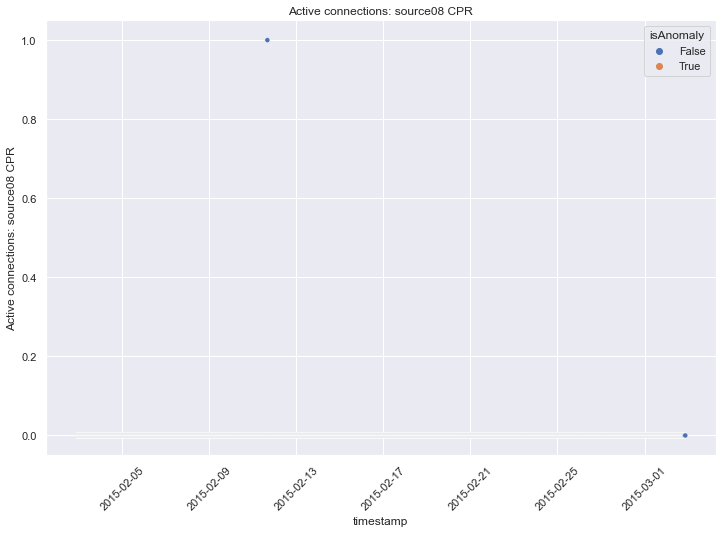

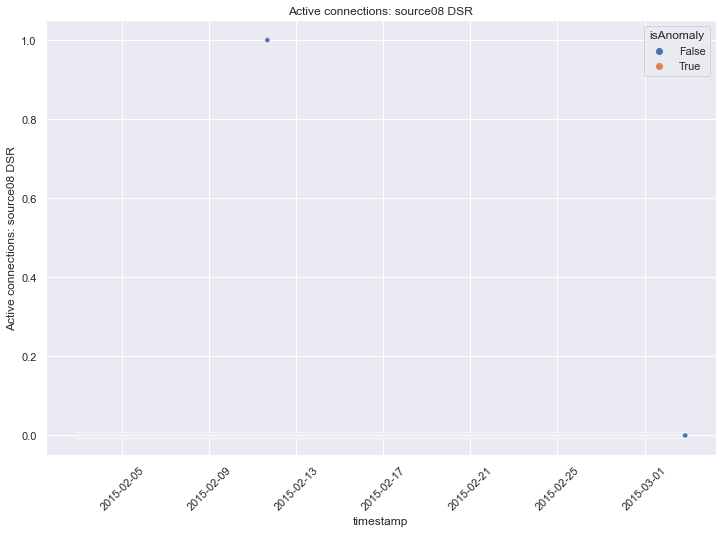

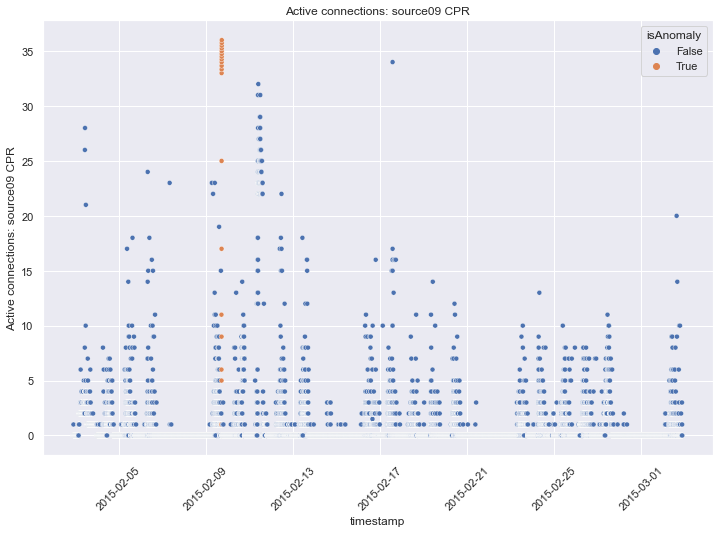

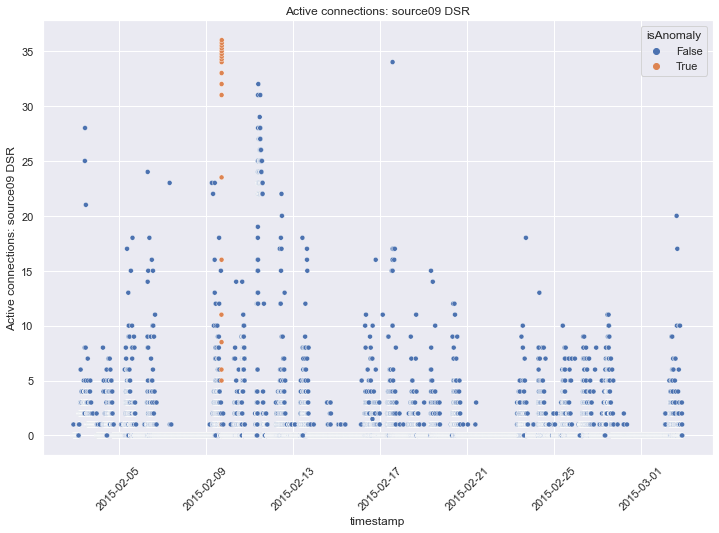

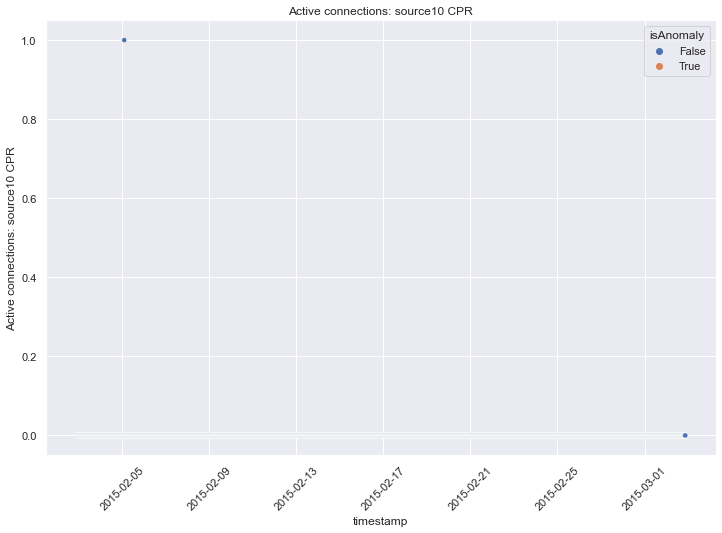

...

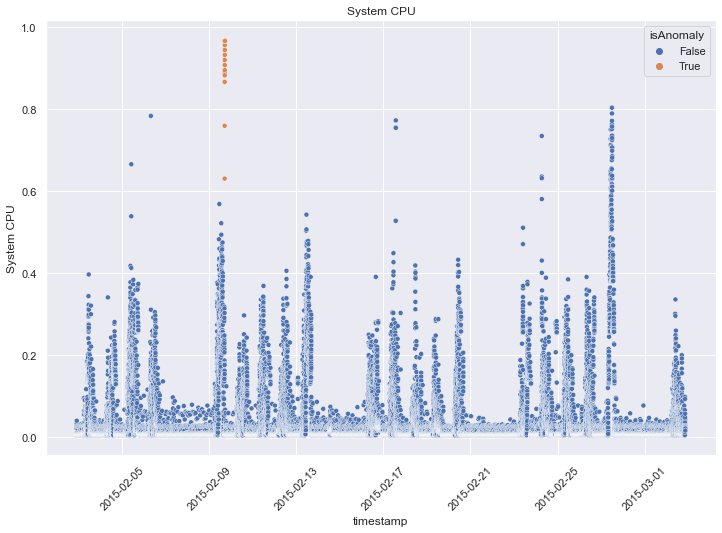

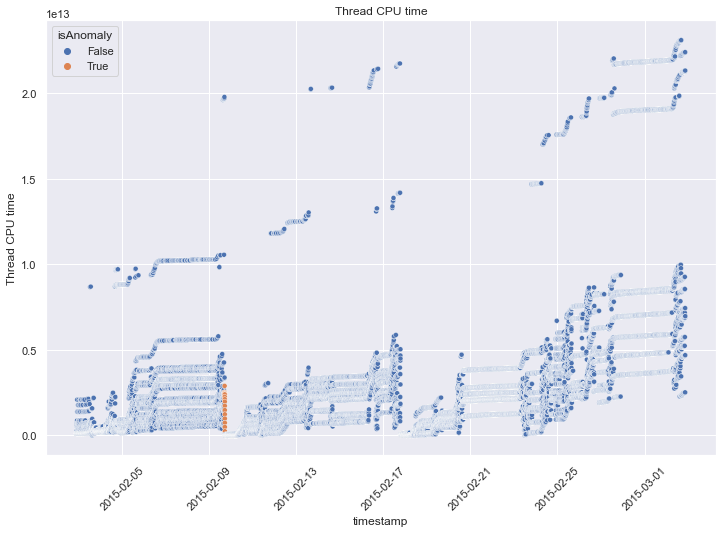

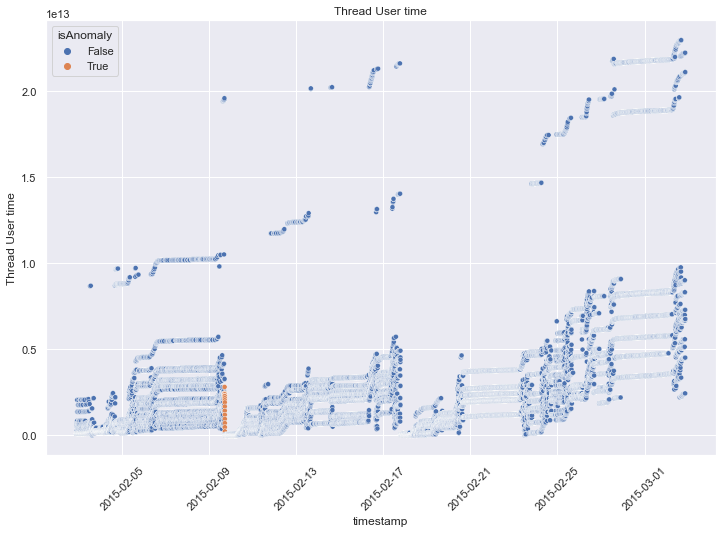

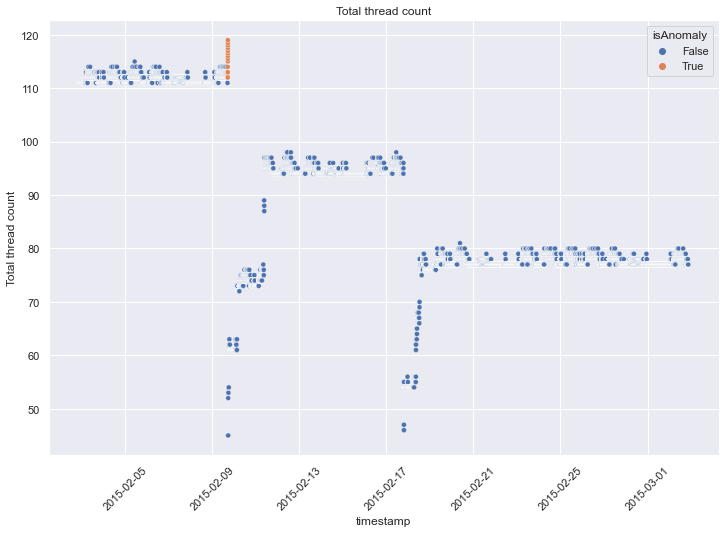

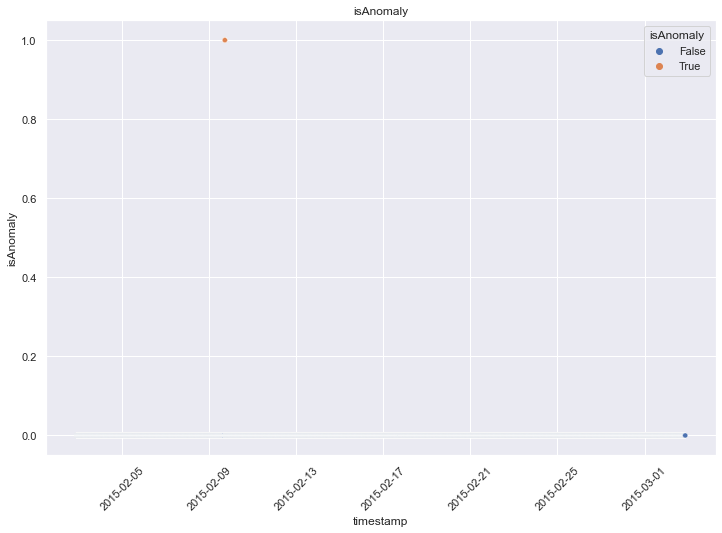

In [18]:
# plot scatterpots of all features against timestamp
for col in sorted(df.drop('timestamp', 1).columns):
    sns.set(rc={'figure.figsize':(12,8)})
    sns.scatterplot(data = df, x='timestamp', y=col, hue='isAnomaly', s=25)
    plt.title(col)
    plt.xticks(rotation=45)
    plt.show()


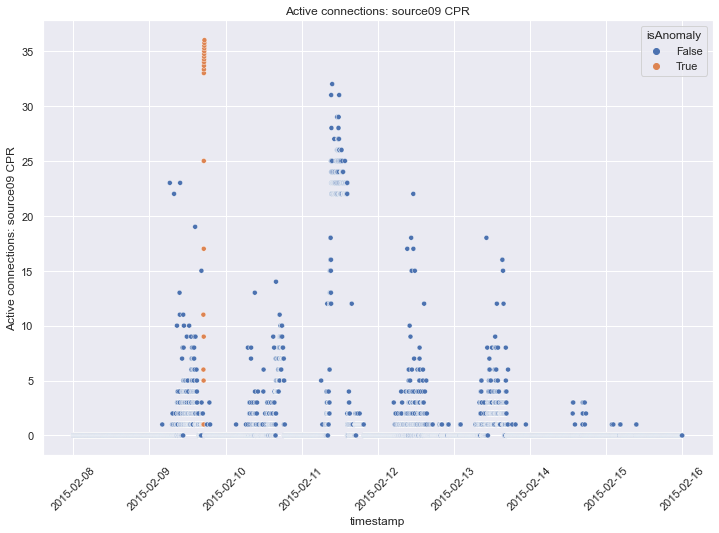

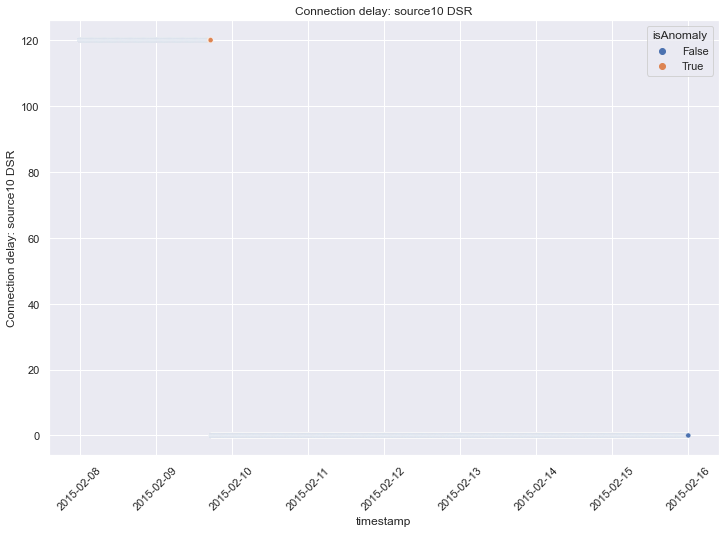

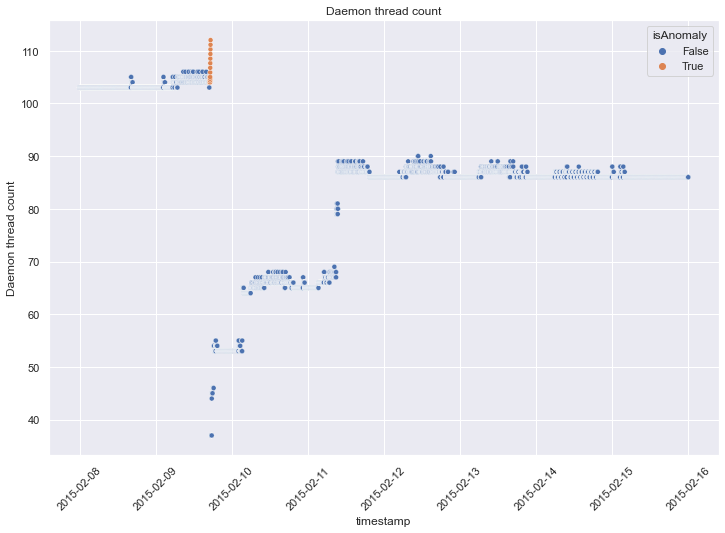

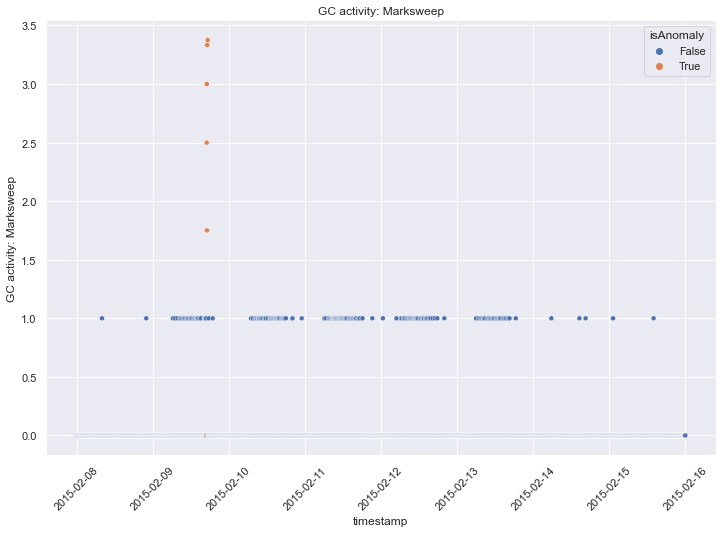

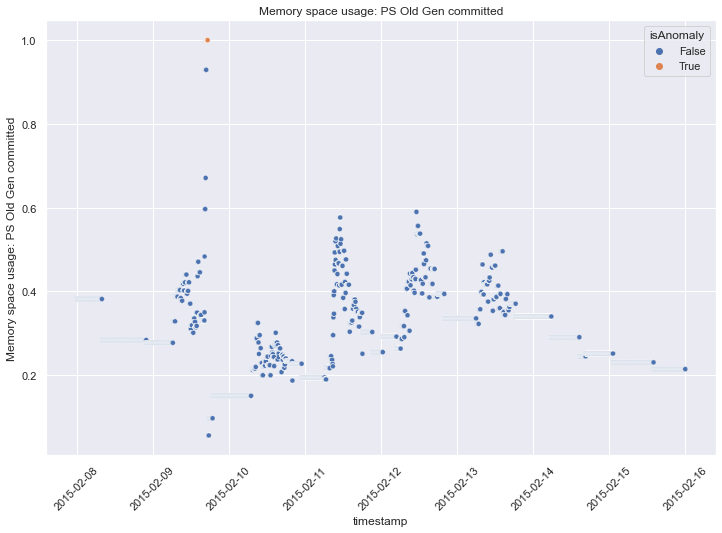

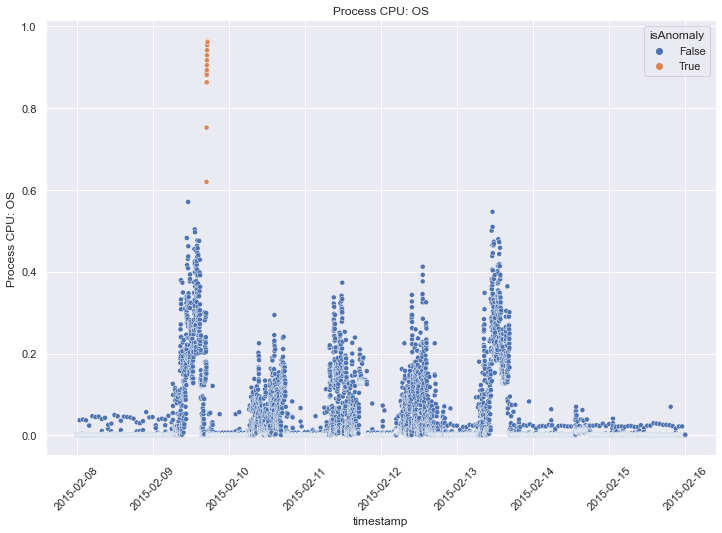

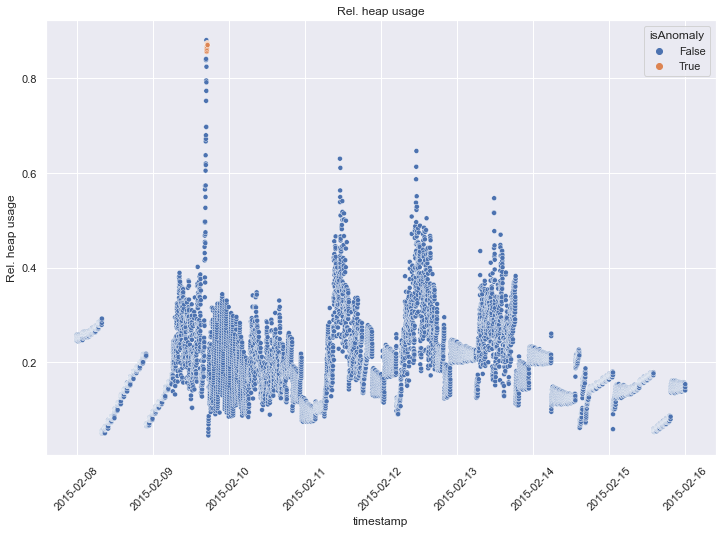

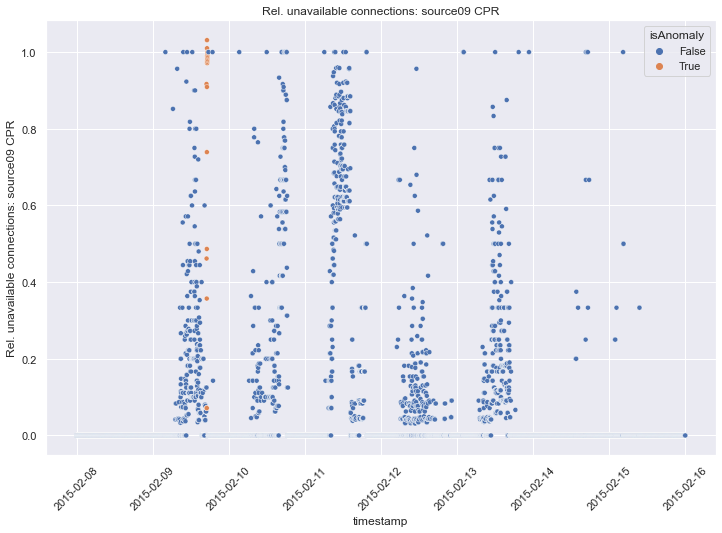

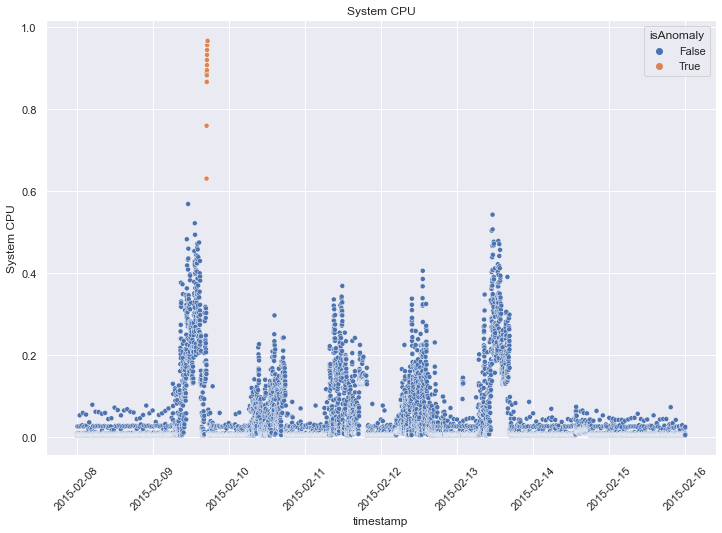

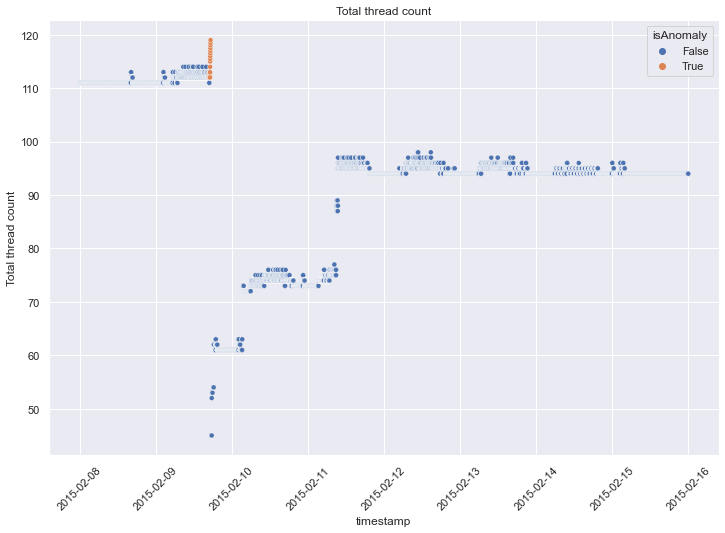

In [19]:
columns = ['Active connections: source09 CPR',
           'Connection delay: source10 DSR',
           'Daemon thread count',
           'GC activity: Marksweep',
           'Memory space usage: PS Old Gen committed',
           'Process CPU: OS',
           'Rel. heap usage',
           'Rel. unavailable connections: source09 CPR',
           'System CPU',
           'Total thread count']
for col in df[columns]:
    sns.set(rc={'figure.figsize':(12,8)})
    sns.scatterplot(data = df[(df['timestamp'] >= '2015-2-08 00:00:00') & (df['timestamp'] < '2015-02-16 00:00:00')], 
                    x='timestamp', 
                    y=col, 
                    hue='isAnomaly', s=25)
    plt.title(col)
    plt.xticks(rotation=45)
    plt.show()

## Heatmap

<AxesSubplot:>

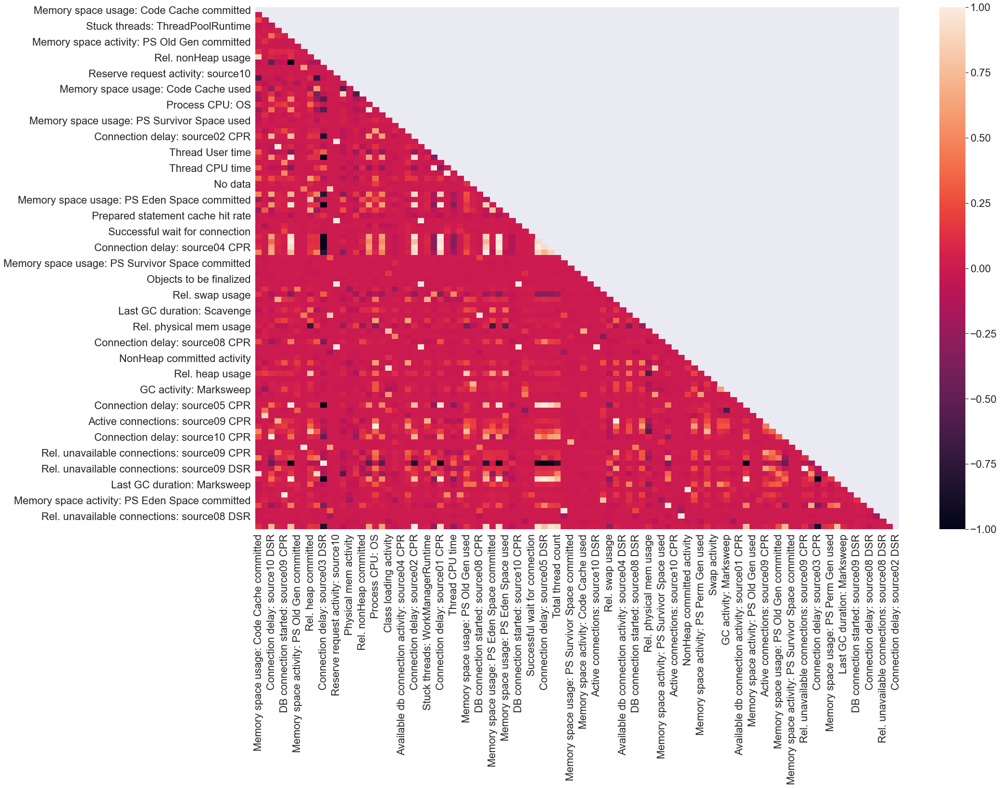

In [20]:
# plot correlation matrix

sns.set(rc={'figure.figsize':(30,20)})
sns.set_context("notebook", font_scale=2, rc={"lines.linewidth": 2.5, 'font.family':'Helvetica'})
corr = df.drop(columns='isAnomaly').corr()
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr, fmt='.1g', vmin=-1, vmax=1, mask=mask)

## Pairplot

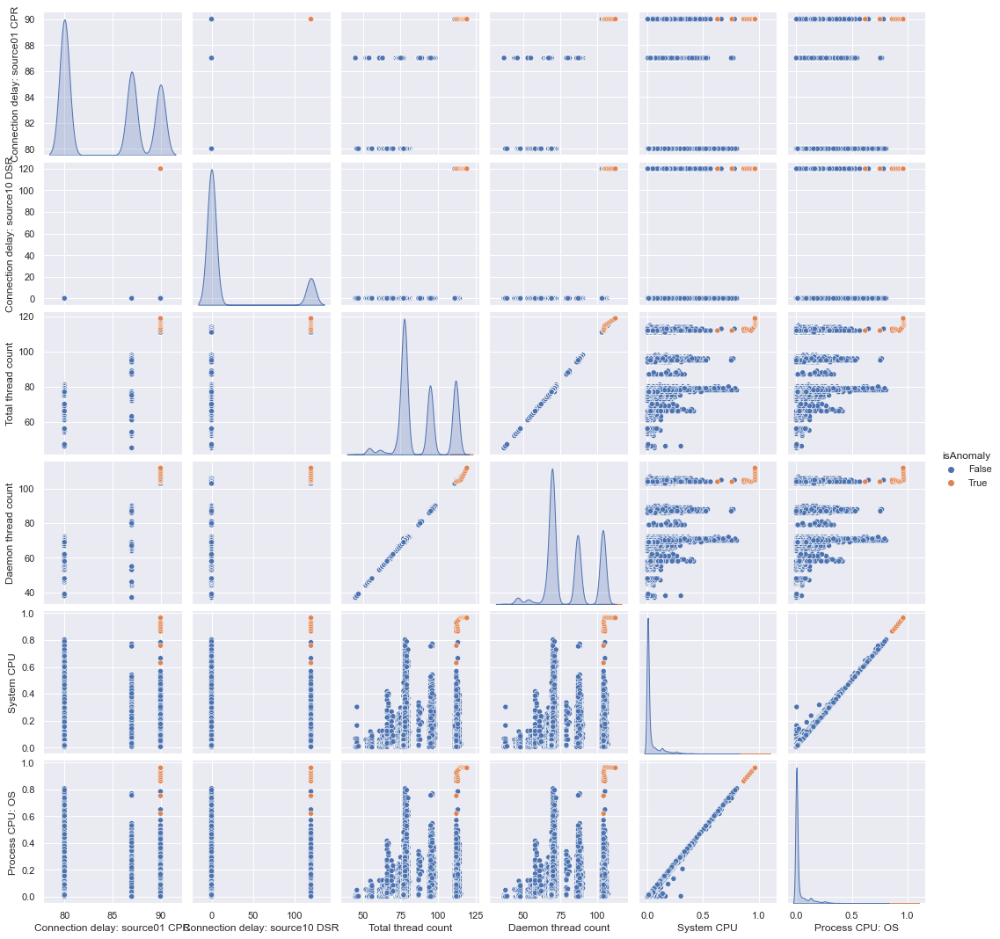

In [21]:
# plot a pairplot of some of the most correlated features

columns_sp = ['Connection delay: source01 CPR', 'Connection delay: source10 DSR',
              'Total thread count', 'Daemon thread count', 
              'System CPU', 'Process CPU: OS',
              'isAnomaly']

#sns.set_theme(style="ticks")
sns.set(font_scale = 1)
plot = sns.pairplot(df[columns_sp], hue="isAnomaly")
plt.xticks(rotation=45)
plt.yticks(rotation=45)
plt.show()

### Datetime features
As we can see below, since all anomalies were reported on the same day, we don't see any signification relationship of anomalies with datetime feature

In [22]:
# extract hour and weekday from timetamp 

df['hour'] = df['timestamp'].dt.hour
df['weekday'] = df['timestamp'].dt.weekday
anomalies = df[df['isAnomaly']==1]

<AxesSubplot:xlabel='hour', ylabel='isAnomaly'>

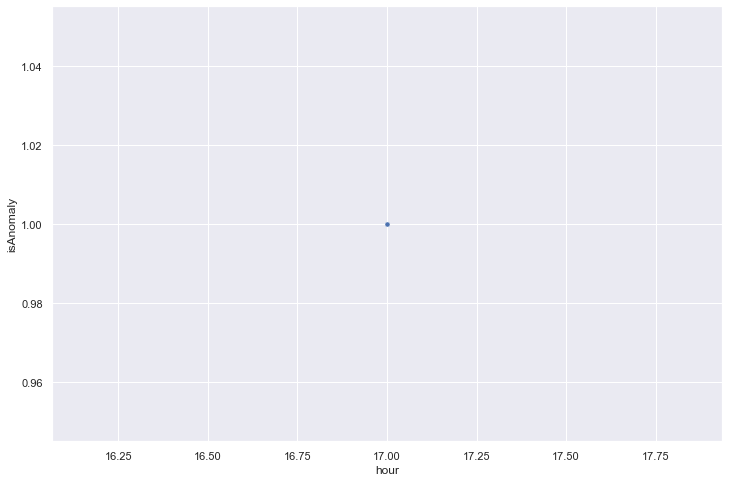

In [23]:
# create scatterplot to determine relationship between anomalies and hour
    
sns.set(rc={'figure.figsize':(12,8)})
sns.scatterplot(data = anomalies, x='hour', y='isAnomaly', s=25)

<AxesSubplot:xlabel='timestamp', ylabel='hour'>

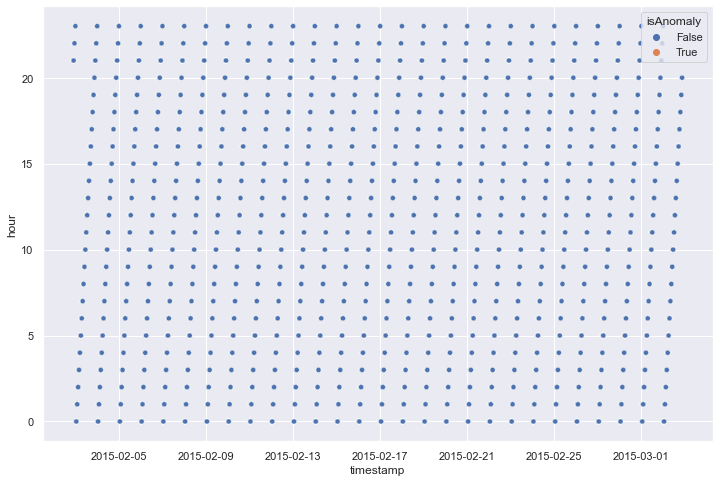

In [24]:
# create scatterplot to determine relationship between anomalies and weekday

sns.set(rc={'figure.figsize':(12,8)})
sns.set(font_scale = 1)
sns.scatterplot(data = df, x='timestamp', y='hour', hue='isAnomaly', s=25)

In [25]:
columns = ['Connection delay: source03 CPR',
           'Connection delay: source03 DSR',
           'Connection delay: source04 CPR',
           'Connection delay: source04 DSR',
           'Connection delay: source05 CPR',
           'Connection delay: source05 DSR',
           'Connection delay: source06 CPR',
           'Connection delay: source06 CPR',
           'Connection delay: source06 DSR',
           'Connection delay: source06 DSR',
           'Connection delay: source08 DSR',
           'Connection delay: source08 DSR',
           'Connection delay: source09 CPR',
           'Connection delay: source09 DSR',
           'Connection delay: source10 CPR',
           'Connection delay: source10 DSR',
           'Connection delay: source10 DSR',
           'Daemon thread count',
           'GC time: Marksweep',
           'GC time: Scavenge',
           'Memory space usage: Code Cache committed',
           'Memory space usage: PS Eden Space committed',
           'Memory space usage: PS Old Gen used',
           'Memory space usage: PS Perm Gen committed',
           'Memory space usage: PS Perm Gen used',
           'NonHeap usage activity',
           'Process CPU: OS',
           'Rel. heap committed',
           'Rel. nonHeap committed',
           'Rel. nonHeap usage',
           'Rel. nonHeap usage',
           'Rel. open file descriptors',
           'Rel. swap usage',
           'Rel. unavailable connections: source09 CPR',
           'Stuck threads: ThreadPoolRuntime',
           'Stuck threads: WorkManagerRuntime',
           'Thread User time',]

df = df.drop(columns=columns)

In [26]:
# save processed dataframe for modeling
df.to_csv('processed.csv')